<a href="https://colab.research.google.com/github/onkarc-dev/Credit-Risk-Data-Assistant-Agent/blob/main/Global_Stock_Market_Forecasting_Using_ML_DL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Global Stock Market Forecasting


In [1]:
# Importing Libraries

# Data handling and statistical analysis

import sys
import subprocess

def install(pkg):
    subprocess.check_call([sys.executable, "-m", "pip", "install", "--upgrade", "yfinance"])


if "google.colab" in sys.modules:
    install("tensorflow")
    install("pystan")
    install("prophet")
    install("pmdarima")
    install("yfinance")
    install("quantstats")
    install("ta")
    install("PyPortfolioOpt")
    install("optuna")


import pandas as pd
import numpy as np
from scipy import stats
from pandas_datareader import data as pdr

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


#Max-min scaling
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import TimeSeriesSplit

#Machine Learning



from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import Huber
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from prophet import Prophet
import statsmodels.api as sm


from pmdarima import auto_arima
import shap
import xgboost as xgb




# Optimization and allocation

from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns
from pypfopt import black_litterman, BlackLittermanModel

# Financial data

import quantstats as qs
import ta
import yfinance as yf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

# For time stamps
from datetime import datetime
from datetime import timedelta

# Linear Regression Model
from sklearn.linear_model import LinearRegression

# Enabling Plotly offline
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

# Datetime and hiding warnings

import datetime as dt
from datetime import datetime, timedelta
import warnings
import pytz
import os
import optuna
# Other
from tabulate import tabulate

warnings.filterwarnings("ignore")

In [2]:
df=pd.DataFrame()

In [3]:

# List of tickers
tickers = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'META','NVDA', 'TSLA', 'JPM', 'V', 'WMT','JNJ', 'XOM', 'TSM', 'KO', 'MCD']


# Get yesterday's date
yesterday = (datetime.now() - timedelta(days=1)).strftime('%Y-%m-%d')

# Download data
df = yf.download(tickers, start="2020-01-01", end=yesterday,group_by=tickers, auto_adjust=False)

# ✅ Reset index to move 'Date' from index to a column
df = df.stack(level=0).reset_index()

# ✅ Rename columns for clarity
df.columns = ['Date', 'Ticker', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

# Display the cleaned DataFrame
df.tail(10)

[*********************100%***********************]  15 of 15 completed


,Date,Ticker,Open,High,Low,Close,Adj Close,Volume
22910,2026-01-30,KO,73.709999,74.900002,73.540001,74.809998,74.809998,26412400
22911,2026-01-30,MCD,315.660004,316.049988,311.570007,315.000000,315.000000,2983200
22912,2026-01-30,META,727.500000,732.169983,713.590027,716.500000,716.500000,23702600
22913,2026-01-30,MSFT,439.170013,439.600006,426.450012,430.290009,430.290009,58470400
22914,2026-01-30,NVDA,191.210007,194.490005,189.470001,191.130005,191.130005,178936900
22915,2026-01-30,TSLA,425.350006,439.880005,422.700012,430.410004,430.410004,82483000
22916,2026-01-30,TSM,335.420013,339.899994,329.100006,330.559998,330.559998,12007100
22917,2026-01-30,V,332.220001,333.000000,321.600006,321.829987,321.829987,11196300
22918,2026-01-30,WMT,116.910004,119.410004,116.599998,119.139999,119.139999,22202700
22919,2026-01-30,XOM,138.740005,142.210007,137.830002,141.399994,141.399994,29636900


In [4]:
df['target_up'] = (df['Close'].shift(-1) / df['Close'] > 1.007).astype(int)
df = df.dropna().reset_index(drop=True)


In [5]:
df.head(5)

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,target_up
0,2020-01-02,AAPL,74.059998,75.150002,73.797501,75.087502,72.468269,135480400,1
1,2020-01-02,AMZN,93.750000,94.900497,93.207497,94.900497,94.900497,80580000,0
2,2020-01-02,GOOGL,67.420502,68.433998,67.324501,68.433998,67.920815,27278000,1
3,2020-01-02,JNJ,145.869995,146.020004,145.080002,145.970001,123.290192,5777000,0
4,2020-01-02,JPM,139.789993,141.100006,139.259995,141.089996,119.036423,10803700,0


In [6]:
df=df.set_index('Date')

In [7]:
df[df['Ticker']=='AAPL'].describe()

,Open,High,Low,Close,Adj Close,Volume,target_up
count,1528.000000,1528.000000,1528.000000,1528.000000,1528.000000,1.528000e+03,1528.000000
mean,168.093946,169.970522,166.362989,168.247376,166.155091,8.411141e+07,0.392016
std,49.714318,50.036322,49.403752,49.736301,50.508927,5.118792e+07,0.488360
min,57.020000,57.125000,53.152500,56.092499,54.264328,1.791060e+07,0.000000
25%,135.004997,136.677505,133.582497,134.869995,131.914658,5.041675e+07,0.000000
50%,167.200005,168.995003,165.555000,166.969994,164.424141,6.988250e+07,0.000000
75%,200.870007,203.275002,199.035004,201.000000,200.577713,9.969168e+07,1.000000
max,286.200012,288.619995,283.299988,286.190002,286.190002,4.265100e+08,1.000000


In [8]:
df[df['Ticker']=='AAPL'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1528 entries, 2020-01-02 to 2026-01-30
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Ticker     1528 non-null   object 
 1   Open       1528 non-null   float64
 2   High       1528 non-null   float64
 3   Low        1528 non-null   float64
 4   Close      1528 non-null   float64
 5   Adj Close  1528 non-null   float64
 6   Volume     1528 non-null   int64  
 7   target_up  1528 non-null   int64  
dtypes: float64(5), int64(2), object(1)
memory usage: 107.4+ KB


In [9]:
df.nunique()

,0
Ticker,15
Open,17276
High,17568
Low,17683
Close,17844
Adj Close,22428
Volume,22446
target_up,2


In [10]:
# 1. ADVANCED: Violin + Box + KDE (Distribution + Outliers)


import plotly.express as px
import plotly.io as pio

# Force Plotly renderer for Colab
pio.renderers.default = "colab"

# The DataFrame 'df' has 'Date' as its index and 'Ticker' as a regular column.
# For plotting with plotly.express, we need both 'Date' and 'Ticker' as regular columns.
# Resetting the index will make 'Date' a column, and 'Ticker' will remain a column.
df_plot = df.reset_index()

# ---- Create interactive violin plot ----
fig = px.violin(
    df_plot, # Use the df_plot with 'Ticker' as a column
    x="Ticker",
    y="Open",
    box=True,
    points="outliers",
    hover_data={
        "Ticker": True,
        "Open": ":.2f"
    },
    color="Ticker"
)

# ---- Layout styling ----
fig.update_layout(
    title={
        "text": "Advanced Distribution of Open Prices (Violin + Box)",
        "x": 0.5,
        "font": {"size": 20}
    },
    xaxis_title="Stock",
    yaxis_title="Open Price",
    template="plotly_white",
    height=600,
    showlegend=False
)

fig.show()

In [11]:
#2. PROFESSIONAL: Log-Scaled Distribution (Cross-Stock Comparability)

import plotly.express as px

fig = px.box(
    df,
    x="Ticker",
    y="Open",
    log_y=True,
    points="outliers",
    facet_col="Ticker",
    facet_col_wrap=5,
    title="Open Price Distribution per Stock (Log Scale – Interactive)",
    facet_row_spacing=0.08, # Moved here from update_layout
    facet_col_spacing=0.04  # Moved here from update_layout
)

fig.update_layout(
    width=1400,
    height=800,
    template="plotly_white",
    showlegend=False,
    margin=dict(l=40, r=40, t=80, b=40)
)

# Clean facet titles
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_annotations(font_size=10)

fig.update_xaxes(title=None)
fig.update_yaxes(matches=None)

fig.show()

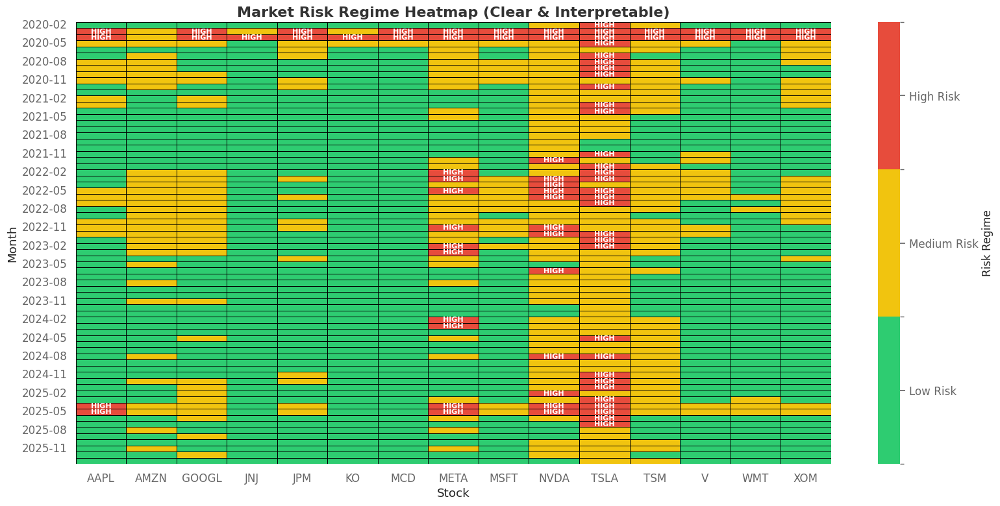

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# 1. PREPARE DATA

df = df.reset_index() # Fix: Reset index to make 'Date' a column
df['Date'] = pd.to_datetime(df['Date'])

# Daily returns
df['returns'] = df.groupby('Ticker')['Close'].pct_change()

# Rolling 30-day volatility
df['volatility_30d'] = (
    df.groupby('Ticker')['returns']
    .transform(lambda x: x.rolling(30).std())
)

# Monthly aggregation
df['Month'] = df['Date'].dt.to_period('M')

# 2. DEFINE RISK REGIMES

bins = [0, 0.02, 0.04, df['volatility_30d'].max()]
labels = ['Low Risk', 'Medium Risk', 'High Risk']

df['risk_regime'] = pd.cut(
    df['volatility_30d'],
    bins=bins,
    labels=labels
)

# Monthly dominant regime per stock
risk_pivot = df.pivot_table(
    index='Month',
    columns='Ticker',
    values='risk_regime',
    aggfunc=lambda x: x.mode()[0] if not x.mode().empty else None
)

# Map to numeric
risk_map = {'Low Risk': 0, 'Medium Risk': 1, 'High Risk': 2}
risk_numeric = risk_pivot.replace(risk_map).astype(float)

# 3. DISCRETE COLORMAP (CRUCIAL FIX)

cmap = ListedColormap(
    [
        "#2ecc71",  # Low Risk - Green
        "#f1c40f",  # Medium Risk - Yellow
        "#e74c3c"   # High Risk - Red
    ]
)

bounds = [-0.5, 0.5, 1.5, 2.5]
norm = BoundaryNorm(bounds, cmap.N)

# 4. PLOT HEATMAP (CLEAR & READABLE)

plt.figure(figsize=(16, 8))

ax = sns.heatmap(
    risk_numeric,
    cmap=cmap,
    norm=norm,
    linewidths=0.4,
    linecolor="black",
    cbar=True
)

# Custom colorbar with text labels
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1, 2])
cbar.set_ticklabels(['Low Risk', 'Medium Risk', 'High Risk'])
cbar.set_label("Risk Regime", fontsize=12)

# Highlight ONLY High Risk cells
for i in range(risk_numeric.shape[0]):
    for j in range(risk_numeric.shape[1]):
        if risk_numeric.iloc[i, j] == 2:
            ax.text(
                j + 0.5, i + 0.5,
                "HIGH",
                ha='center', va='center',
                color='white',
                fontsize=8,
                fontweight='bold'
            )

# Titles & labels
plt.title(
    "Market Risk Regime Heatmap (Clear & Interpretable)",
    fontsize=16,
    fontweight='bold'
)

plt.xlabel("Stock")
plt.ylabel("Month")
plt.tight_layout()
plt.show()

In [13]:
import quantstats as qs
import pandas as pd
import yfinance as yf
from datetime import datetime, timedelta

# Define df (copied from earlier cells to make this cell self-contained for the fix)
tickers = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'META','NVDA', 'TSLA', 'JPM', 'V', 'WMT','JNJ', 'XOM', 'TSM', 'KO', 'MCD']
yesterday = (datetime.now() - timedelta(days=1)).strftime('%Y-%m-%d')
df = yf.download(tickers, start="2020-01-01", end=yesterday,group_by=tickers, auto_adjust=False)
df = df.stack(level=0).reset_index()
df.columns = ['Date', 'Ticker', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']
df['target_up'] = (df['Close'].shift(-1) > df['Close']).astype(int)

# Measuring skewness with quantstats
print('Measuring skewness of each company:')

print("Apple's skewness: ", qs.stats.skew(df[df['Ticker'] == 'AAPL']['Open']).round(3))
print("Microsoft's skewness: ", qs.stats.skew(df[df['Ticker'] == 'MSFT']['Open']).round(3))
print("Google's skewness: ", qs.stats.skew(df[df['Ticker'] == 'GOOGL']['Open']).round(3))
print("Amazon's skewness: ", qs.stats.skew(df[df['Ticker'] == 'AMZN']['Open']).round(3))
print("Meta's skewness: ", qs.stats.skew(df[df['Ticker'] == 'META']['Open']).round(3))
print("NVIDIA's skewness: ", qs.stats.skew(df[df['Ticker'] == 'NVDA']['Open']).round(3))
print("Tesla's skewness: ", qs.stats.skew(df[df['Ticker'] == 'TSLA']['Open']).round(3))
print("JPMorgan Chase's skewness: ", qs.stats.skew(df[df['Ticker'] == 'JPM']['Open']).round(3))
print("Visa's skewness: ", qs.stats.skew(df[df['Ticker'] == 'V']['Open']).round(3))
print("Walmart's skewness: ", qs.stats.skew(df[df['Ticker'] == 'WMT']['Open']).round(3))
print("Johnson & Johnson's skewness: ", qs.stats.skew(df[df['Ticker'] == 'JNJ']['Open']).round(3))
print("Exxon Mobil's skewness: ", qs.stats.skew(df[df['Ticker'] == 'XOM']['Open']).round(3))
print("TSMC's skewness: ", qs.stats.skew(df[df['Ticker'] == 'TSM']['Open']).round(3))
print("Coca-Cola's skewness: ", qs.stats.skew(df[df['Ticker'] == 'KO']['Open']).round(3))
print("McDonald's skewness: ", qs.stats.skew(df[df['Ticker'] == 'MCD']['Open']).round(3))

[*********************100%***********************]  15 of 15 completed


Measuring skewness of each company:
Apple's skewness:  0.066
Microsoft's skewness:  -0.003
Google's skewness:  0.429
Amazon's skewness:  0.143
Meta's skewness:  -0.303
NVIDIA's skewness:  0.323
Tesla's skewness:  0.409
JPMorgan Chase's skewness:  -0.024
Visa's skewness:  -0.147
Walmart's skewness:  0.266
Johnson & Johnson's skewness:  -0.359
Exxon Mobil's skewness:  -0.306
TSMC's skewness:  0.236
Coca-Cola's skewness:  -0.923
McDonald's skewness:  0.038


In [14]:
import numpy as np
import pandas as pd
import yfinance as yf
import quantstats as qs
from datetime import datetime, timedelta

# 1. Configuration
TICKERS = [
    'AAPL', 'MSFT', 'GOOGL', 'AMZN', 'META',
    'NVDA', 'TSLA', 'JPM', 'V', 'WMT',
    'JNJ', 'XOM', 'TSM', 'KO', 'MCD'
]

START_DATE = "2020-01-01"
END_DATE = (datetime.now() - timedelta(days=1)).strftime('%Y-%m-%d')

# 2. Data Download & Reshaping
raw = yf.download(
    TICKERS,
    start=START_DATE,
    end=END_DATE,
    group_by='ticker',
    auto_adjust=False,
    progress=False
)

df = (
    raw.stack(level=0)
       .reset_index()
       .rename(columns={
           'level_1': 'Ticker',
           'Adj Close': 'Adj_Close'
       })
)

# 3. Feature Engineering
# Log returns (industry standard)
df['log_return'] = (
    df.groupby('Ticker')['Adj_Close']
      .transform(lambda x: np.log(x / x.shift(1)))
)
# Binary direction target (ML-ready)
df['target_up'] = (
    df.groupby('Ticker')['Adj_Close']
      .shift(-1) > df['Adj_Close']
).astype(int)

# 4. Advanced Risk & Distribution Metrics
risk_metrics = (
    df.groupby('Ticker')['log_return']
      .agg(
          Skewness=lambda x: qs.stats.skew(x),
          Kurtosis=lambda x: qs.stats.kurtosis(x),
          Volatility=lambda x: qs.stats.volatility(x),
          VaR_95=lambda x: qs.stats.var(x, 0.95),
          CVaR_95=lambda x: qs.stats.cvar(x, 0.95)
      )
      .round(4)
      .reset_index()
)

# 5. Risk Ranking (Quant Style)
risk_metrics['Risk_Score'] = (
    -risk_metrics['Skewness'] +
     risk_metrics['CVaR_95'].abs() +
     risk_metrics['Volatility']
).round(4)

risk_metrics = risk_metrics.sort_values('Risk_Score')
# 6. Output

print("\n📊 Advanced Cross-Sectional Risk Metrics\n")
print(risk_metrics)

print("\n🧠 Sample ML-Ready Dataset\n")
print(df[['Date', 'Ticker', 'log_return', 'target_up']].dropna().head())


📊 Advanced Cross-Sectional Risk Metrics

   Ticker  Skewness  Kurtosis  Volatility  VaR_95  CVaR_95  Risk_Score
3     JNJ    0.0743    8.0707      0.1960 -0.0189  -0.0309      0.1526
0    AAPL    0.0323    6.5062      0.3161 -0.0303  -0.0448      0.3286
13    WMT   -0.1136   12.5859      0.2292 -0.0218  -0.0371      0.3799
12      V   -0.0827   10.2753      0.2700 -0.0262  -0.0421      0.3948
11    TSM    0.0396    3.3642      0.3871 -0.0369  -0.0538      0.4013
4     JPM   -0.0761   12.4687      0.3126 -0.0302  -0.0479      0.4366
1    AMZN   -0.0701    4.3290      0.3557 -0.0344  -0.0524      0.4782
2   GOOGL   -0.1736    3.7417      0.3231 -0.0308  -0.0463      0.5430
9    NVDA    0.0438    4.1284      0.5263 -0.0495  -0.0723      0.5548
6     MCD   -0.3145   32.0603      0.2257 -0.0218  -0.0409      0.5811
14    XOM   -0.2220    4.9355      0.3277 -0.0316  -0.0478      0.5975
8    MSFT   -0.2620    8.0754      0.2977 -0.0286  -0.0437      0.6034
10   TSLA   -0.0857    3.3607      

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

# Tickers & companies
tickers = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'META','NVDA', 'TSLA', 'JPM', 'V', 'WMT',
           'JNJ', 'XOM', 'TSM', 'KO', 'MCD']

companies = ['Apple','Microsoft','Google','Amazon','Meta','NVIDIA','Tesla',
             'JPMorgan Chase','Visa','Walmart','Johnson & Johnson','Exxon Mobil',
             'TSMC','Coca-Cola','McDonald’s']

# Dynamic grid
cols = 5
rows = math.ceil(len(tickers) / cols)

# Create subplot layout
fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=companies
)

# Add histograms
for idx, (ticker, company) in enumerate(zip(tickers, companies)):
    row = idx // cols + 1
    col = idx % cols + 1

    ticker_data = df[df['Ticker'] == ticker]

    fig.add_trace(
        go.Histogram(
            x=ticker_data['Close'],
            nbinsx=30,
            opacity=0.75,
            hovertemplate=
            "<b>Close Price:</b> %{x:.2f}<br>" +
            "<b>Frequency:</b> %{y}<extra></extra>"
        ),
        row=row,
        col=col
    )

# Layout styling (professional)
fig.update_layout(
    height=350 * rows,
    width=1600,
    title_text="Interactive Distribution of Close Prices (Hover to Inspect Exact Values)",
    template="plotly_white",
    showlegend=False
)

fig.show()


In [16]:
import yfinance as yf
from datetime import datetime, timedelta

# Re-download data for all tickers to ensure 'df' has the 'Ticker' column
tickers = ['AAPL', 'MSFT', 'GOOGL', 'AMZN', 'META','NVDA', 'TSLA', 'JPM', 'V', 'WMT','JNJ', 'XOM', 'TSM', 'KO', 'MCD']
yesterday = (datetime.now() - timedelta(days=1)).strftime('%Y-%m-%d')
df = yf.download(tickers, start="2020-01-01", end=yesterday,group_by=tickers, auto_adjust=False)
df = df.stack(level=0).reset_index()
df.columns = ['Date', 'Ticker', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

# Set 'Date' as index for consistency with other analysis cells, but 'Ticker' remains a column.
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date')

# Measuring skewness with quantstats
print('Measuring skewness of each company:')

print("Apple's skewness: ", qs.stats.skew(df[df['Ticker'] == 'AAPL']['Close']).round(3))
print("Microsoft's skewness: ", qs.stats.skew(df[df['Ticker'] == 'MSFT']['Close']).round(3))
print("Google's skewness: ", qs.stats.skew(df[df['Ticker'] == 'GOOGL']['Close']).round(3))
print("Amazon's skewness: ", qs.stats.skew(df[df['Ticker'] == 'AMZN']['Close']).round(3))
print("Meta's skewness: ", qs.stats.skew(df[df['Ticker'] == 'META']['Close']).round(3))
print("NVIDIA's skewness: ", qs.stats.skew(df[df['Ticker'] == 'NVDA']['Close']).round(3))
print("Tesla's skewness: ", qs.stats.skew(df[df['Ticker'] == 'TSLA']['Close']).round(3))
print("JPMorgan Chase's skewness: ", qs.stats.skew(df[df['Ticker'] == 'JPM']['Close']).round(3))
print("Visa's skewness: ", qs.stats.skew(df[df['Ticker'] == 'V']['Close']).round(3))
print("Walmart's skewness: ", qs.stats.skew(df[df['Ticker'] == 'WMT']['Close']).round(3))
print("Johnson & Johnson's skewness: ", qs.stats.skew(df[df['Ticker'] == 'JNJ']['Close']).round(3))
print("Exxon Mobil's skewness: ", qs.stats.skew(df[df['Ticker'] == 'XOM']['Close']).round(3))
print("TSMC's skewness: ", qs.stats.skew(df[df['Ticker'] == 'TSM']['Close']).round(3))
print("Coca-Cola's skewness: ", qs.stats.skew(df[df['Ticker'] == 'KO']['Close']).round(3))
print("McDonald's skewness: ", qs.stats.skew(df[df['Ticker'] == 'MCD']['Close']).round(3))

[*********************100%***********************]  15 of 15 completed


Measuring skewness of each company:
Apple's skewness:  0.289
Microsoft's skewness:  0.017
Google's skewness:  -0.001
Amazon's skewness:  0.141
Meta's skewness:  -0.154
NVIDIA's skewness:  0.352
Tesla's skewness:  0.245
JPMorgan Chase's skewness:  0.348
Visa's skewness:  0.232
Walmart's skewness:  0.206
Johnson & Johnson's skewness:  0.263
Exxon Mobil's skewness:  -0.0
TSMC's skewness:  0.234
Coca-Cola's skewness:  -0.551
McDonald's skewness:  0.411


In [17]:
import plotly.express as px

# Map tickers to company names
ticker_company = {
    'AAPL': 'Apple','MSFT': 'Microsoft','GOOGL': 'Google','AMZN': 'Amazon',
    'META': 'Meta','NVDA': 'NVIDIA','TSLA': 'Tesla','JPM': 'JPMorgan Chase',
    'V': 'Visa','WMT': 'Walmart','JNJ': 'Johnson & Johnson','XOM': 'Exxon Mobil',
    'TSM': 'TSMC','KO': 'Coca-Cola','MCD': 'McDonald’s'
}

# Ensure 'Date' is a column for plotting purposes if it's currently the index
df_plot = df.reset_index()

df_plot['Company'] = df_plot['Ticker'].map(ticker_company)

fig = px.scatter(
    df_plot, # Use df_plot where 'Date' is a column
    x="Open",
    y="Close",
    facet_col="Company",
    facet_col_wrap=5,
    opacity=0.25,                 # reduces clutter
    trendline="ols",              # focus on relationship
    trendline_color_override="black",
    hover_data={
        "Date": True, # 'Date' is now a column in df_plot
        "Ticker": True,
        "Open": ':.2f',
        "Close": ':.2f'
    },
    title="Open vs Close Price — Clean, Focused & Interactive"
)

# Visual polish
fig.update_traces(
    marker=dict(size=4)           # 🔑 smaller points
)

fig.update_layout(
    height=900,
    width=1500,
    showlegend=False,
    plot_bgcolor="white"
)

fig.update_xaxes(showgrid=True, gridcolor="lightgray")
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


In [18]:
import plotly.express as px

# Daily return (your logic is correct)
df['Daily Return'] = df.groupby('Ticker')['Adj Close'].pct_change()

# Ticker → Company mapping
ticker_company = {
    'AAPL': 'Apple','MSFT': 'Microsoft','GOOGL': 'Google','AMZN': 'Amazon',
    'META': 'Meta','NVDA': 'NVIDIA','TSLA': 'Tesla','JPM': 'JPMorgan Chase',
    'V': 'Visa','WMT': 'Walmart','JNJ': 'Johnson & Johnson','XOM': 'Exxon Mobil',
    'TSM': 'TSMC','KO': 'Coca-Cola','MCD': 'McDonald’s'
}

df['Company'] = df['Ticker'].map(ticker_company)

# Remove NaNs and reset index to make 'Date' a column
plot_df = df.dropna(subset=['Daily Return']).reset_index()

# Interactive plot
fig = px.line(
    plot_df,
    x="Date",
    y="Daily Return",
    facet_col="Company",
    facet_col_wrap=5,
    title="Daily Returns (Hover on any point to see exact value)",
    hover_data={
        "Date": True,
        "Ticker": True,
        "Daily Return": ':.4%'   #   exact value shown on hover
    }
)

# Formatting
fig.update_layout(
    height=900,
    width=1600,
    showlegend=False,
    plot_bgcolor="white"
)

fig.update_yaxes(tickformat=".2%")
fig.update_xaxes(showgrid=True, gridcolor="lightgray")
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


In [19]:
import plotly.express as px

# Daily returns (correct)

df['Daily Return'] = df.groupby('Ticker')['Adj Close'].pct_change()

# Ticker → Company mapping

ticker_names = {
    'AAPL': 'Apple','MSFT': 'Microsoft','GOOGL': 'Google','AMZN': 'Amazon',
    'META': 'Meta','NVDA': 'NVIDIA','TSLA': 'Tesla','JPM': 'JPMorgan Chase',
    'V': 'Visa','WMT': 'Walmart','JNJ': 'Johnson & Johnson','XOM': 'Exxon Mobil',
    'TSM': 'TSMC','KO': 'Coca-Cola','MCD': "McDonald's"
}

df['Company'] = df['Ticker'].map(ticker_names)

# Remove NaNs
plot_df = df.dropna(subset=['Daily Return'])

# Interactive histogram grid

fig = px.histogram(
    plot_df,
    x="Daily Return",
    facet_col="Company",
    facet_col_wrap=5,
    nbins=60,                     # 🔑 smooth but detailed
    opacity=0.75,
    title="Daily Return Distribution (Hover for Exact Values)",
    hover_data={
        "Daily Return": ':.4%'    # 🔑 exact value on cursor
    }
)

# Visual polish

fig.update_layout(
    height=900,
    width=1600,
    bargap=0.12,                  # 🔑 clean gaps
    showlegend=False,
    plot_bgcolor="white"
)

fig.update_xaxes(
    tickformat=".2%",
    showgrid=True,
    gridcolor="lightgray"
)

fig.update_yaxes(
    showgrid=True,
    gridcolor="lightgray"
)

fig.show()


In [20]:
import plotly.express as px

# Map tickers to company names (optional but cleaner titles)
ticker_company = {
    'AAPL': 'Apple','MSFT': 'Microsoft','GOOGL': 'Google','AMZN': 'Amazon',
    'META': 'Meta','NVDA': 'NVIDIA','TSLA': 'Tesla','JPM': 'JPMorgan Chase',
    'V': 'Visa','WMT': 'Walmart','JNJ': 'Johnson & Johnson','XOM': 'Exxon Mobil',
    'TSM': 'TSMC','KO': 'Coca-Cola','MCD': "McDonald's"
}

df['Company'] = df['Ticker'].map(ticker_company)

# Remove rows with missing prices and reset index to make 'Date' a column
plot_df = df.dropna(subset=['Adj Close']).reset_index()

# Interactive adjusted close price grid
fig = px.line(
    plot_df,
    x="Date",
    y="Adj Close",
    facet_col="Company",
    facet_col_wrap=5,
    title="Adjusted Closing Prices (Hover to See Exact Values)",
    hover_data={
        "Date": True,
        "Ticker": True,
        "Adj Close": ':.2f'   # ❅ exact value on cursor
    }
)

# Visual polish
fig.update_layout(
    height=900,
    width=1600,
    showlegend=False,
    plot_bgcolor="white"
)

fig.update_xaxes(showgrid=True, gridcolor="lightgray")
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


In [21]:
import plotly.express as px

# Map tickers to company names (optional, for cleaner titles)
ticker_company = {
    'AAPL': 'Apple','MSFT': 'Microsoft','GOOGL': 'Google','AMZN': 'Amazon',
    'META': 'Meta','NVDA': 'NVIDIA','TSLA': 'Tesla','JPM': 'JPMorgan Chase',
    'V': 'Visa','WMT': 'Walmart','JNJ': 'Johnson & Johnson','XOM': 'Exxon Mobil',
    'TSM': 'TSMC','KO': 'Coca-Cola','MCD': "McDonald's"
}

df['Company'] = df['Ticker'].map(ticker_company)

# Remove missing volume rows (safety) and reset index to make 'Date' a column
plot_df = df.dropna(subset=['Volume']).reset_index()

# Interactive volume grid
fig = px.line(
    plot_df,
    x="Date",
    y="Volume",
    facet_col="Company",
    facet_col_wrap=5,
    title="Trading Volume per Stock (Hover to See Exact Values)",
    hover_data={
        "Date": True,
        "Ticker": True,
        "Volume": ':,'   # 🔑 comma-separated exact volume
    }
)

# Visual polish
fig.update_layout(
    height=900,
    width=1600,
    showlegend=False,
    plot_bgcolor="white"
)

fig.update_xaxes(showgrid=True, gridcolor="lightgray")
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


In [22]:
import plotly.express as px

# ---------------------------
# Moving averages
# ---------------------------
ma_days = [10, 20, 50]

for ma in ma_days:
    df[f"MA_{ma}"] = df.groupby('Ticker')['Adj Close'].transform(
        lambda x: x.rolling(ma).mean()
    )

# Ticker → Company mapping
ticker_company = {
    'AAPL': 'Apple','MSFT': 'Microsoft','GOOGL': 'Google','AMZN': 'Amazon',
    'META': 'Meta','NVDA': 'NVIDIA','TSLA': 'Tesla','JPM': 'JPMorgan Chase',
    'V': 'Visa','WMT': 'Walmart','JNJ': 'Johnson & Johnson','XOM': 'Exxon Mobil',
    'TSM': 'TSMC','KO': 'Coca-Cola','MCD': "McDonald's"
}

df['Company'] = df['Ticker'].map(ticker_company)

# Reset index to make 'Date' a column for melting
df = df.reset_index()

# ---------------------------
# Reshape for plotting
# ---------------------------
plot_df = df.melt(
    id_vars=['Date', 'Ticker', 'Company'],
    value_vars=['Adj Close', 'MA_10', 'MA_20', 'MA_50'],
    var_name='Series',
    value_name='Price'
).dropna()

# ---------------------------
# Interactive MA chart grid
# ---------------------------
fig = px.line(
    plot_df,
    x="Date",
    y="Price",
    color="Series",
    facet_col="Company",
    facet_col_wrap=5,
    title="Adjusted Close with Moving Averages (Hover for Exact Values)",
    hover_data={
        "Date": True,
        "Ticker": True,
        "Series": True,
        "Price": ':.2f'
    }
)

# ---------------------------
# Visual polish
# ---------------------------
fig.update_layout(
    height=950,
    width=1600,
    plot_bgcolor="white"
)

fig.update_xaxes(showgrid=True, gridcolor="lightgray")
fig.update_yaxes(showgrid=True, gridcolor="lightgray")

fig.show()


In [23]:
# Pivot the DataFrame to get 'Adj Close' values for each company as columns
adj_close_df = df.pivot_table(values='Daily Return', index='Date', columns='Ticker')
adj_close_df

Ticker,AAPL,AMZN,GOOGL,JNJ,JPM,KO,MCD,META,MSFT,NVDA,TSLA,TSM,V,WMT,XOM
Date,,,,,,,,,,,,,,,
2020-01-03,-0.009722,-0.012139,-0.005231,-0.011578,-0.013196,-0.005456,-0.003536,-0.005291,-0.012452,-0.016006,0.029633,-0.032978,-0.007953,-0.008828,-0.008039
2020-01-06,0.007968,0.014886,0.026654,-0.001247,-0.000795,-0.000366,0.011245,0.018834,0.002585,0.004194,0.019255,-0.011540,-0.002163,-0.002036,0.007678
2020-01-07,-0.004703,0.002092,-0.001932,0.006107,-0.017001,-0.007683,0.001483,0.002164,-0.009118,0.012107,0.038801,0.016205,-0.002643,-0.009265,-0.008184
2020-01-08,0.016086,-0.007809,0.007118,-0.000138,0.007801,0.001843,0.016187,0.010138,0.015928,0.001876,0.049205,0.007373,0.017118,-0.003432,-0.015080
2020-01-09,0.021241,0.004799,0.010498,0.002966,0.003651,0.018215,0.011850,0.014311,0.012493,0.010983,-0.021945,0.008170,0.006930,0.010331,0.007656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-01-26,0.029713,-0.003094,0.016254,0.006132,0.011151,-0.004391,0.011964,0.020645,0.009293,-0.006394,-0.030864,-0.006450,0.007082,-0.000764,-0.000963
2026-01-27,0.011198,0.026256,0.003871,0.013319,-0.002425,0.013644,0.003771,0.000907,0.021902,0.010994,-0.009881,0.016922,-0.009833,-0.005950,0.014758
2026-01-28,-0.007086,-0.006825,0.004364,0.014614,0.001532,-0.006662,-0.004234,-0.006300,0.002185,0.015913,0.001300,0.011704,0.005288,-0.003164,0.005481


In [24]:
import plotly.express as px

fig = px.scatter_matrix(
    adj_close_df,
    dimensions=adj_close_df.columns,
    title="Interactive Pairwise Relationship of Adjusted Close Prices",
    opacity=0.6
)

fig.update_traces(
    diagonal_visible=True,
    marker=dict(size=5)
)

fig.update_layout(
    width=1100,
    height=900,
    dragmode='select',
    plot_bgcolor='white'
)

fig.show()


In [25]:
import plotly.express as px

# Compute correlation
corr = adj_close_df.corr()

fig = px.imshow(
    corr,
    text_auto=".2f",
    color_continuous_scale="PuBu",
    title="Interactive Correlation Heatmap (Hover to See Values)"
)

fig.update_layout(
    width=900,
    height=800,
    xaxis_title="Stocks",
    yaxis_title="Stocks"
)

fig.show()


In [26]:
df = yf.download('AAPL', start='2020-01-01', end=datetime.now(),auto_adjust=False)
# Reshape the DataFrame so tickers appear in rows
df.columns =df.columns.droplevel(1)

#df=df.set_index('Date')
# Step 2: Filter only the relevant columns (Price, Adj Close, Close, High, Low, Open, Volume)
df = df[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']]


# Display the reshaped DataFrame
df.tail(10)

[*********************100%***********************]  1 of 1 completed


Price,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2026-01-16,257.899994,258.899994,254.929993,255.529999,255.529999,72142800
2026-01-20,252.729996,254.789993,243.419998,246.699997,246.699997,80267500
2026-01-21,248.699997,251.559998,245.179993,247.649994,247.649994,54641700
2026-01-22,249.199997,251.000000,248.149994,248.350006,248.350006,39708300
2026-01-23,247.320007,249.410004,244.679993,248.039993,248.039993,41689000
2026-01-26,251.479996,256.559998,249.800003,255.410004,255.410004,55969200
2026-01-27,259.170013,261.950012,258.209991,258.269989,258.269989,49648300
2026-01-28,257.649994,258.859985,254.509995,256.440002,256.440002,41288000
2026-01-29,258.000000,259.649994,254.410004,258.279999,258.279999,67253000


In [27]:
import pandas as pd

def extracting_features(df):
    """Extracts key financial indicators from a Yahoo Finance dataset."""

    df = df.copy()

    # Ensure Date column is datetime
    df['Date'] = pd.to_datetime(df['Date'])

    # Price Change (Close - Open)
    df['price_change'] = df['Close'] - df['Open']

    # Returns (Daily Percentage Change)
    df['returns'] = df['Close'].pct_change()

    # Average Price
    df['average_price'] = (df['Close'] + df['Open']) / 2

    # Price Range (High - Low)
    df['price_range'] = df['High'] - df['Low']

    # Volume Change
    df['volume_change'] = df['Volume'].diff()

    # Moving Average
    df['moving_average_10'] = df['Close'].rolling(window=10).mean()

    # Relative Strength Index (RSI)
    window = 14
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))

    # MACD (Moving Average Convergence Divergence)
    short_ema = df['Close'].ewm(span=12, adjust=False).mean()
    long_ema = df['Close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = short_ema - long_ema
    df['MACD_Signal'] = df['MACD'].ewm(span=9, adjust=False).mean()

    # Bollinger Bands (20-Day Moving Average ± 2 Standard Deviations)
    df['20_SMA'] = df['Close'].rolling(window=20).mean()
    df['BB_Upper'] = df['20_SMA'] + (df['Close'].rolling(window=20).std() * 2)
    df['BB_Lower'] = df['20_SMA'] - (df['Close'].rolling(window=20).std() * 2)

    # Fill missing values with 0 (especially for rolling indicators)
    df.fillna(0, inplace=True)

    return df

def is_spring(ds):
    """Check if the date falls in Spring (March-May)."""
    date = pd.to_datetime(ds)
    return int(3 <= date.month <= 5)

def is_summer(ds):
    """Check if the date falls in Summer (June-August)."""
    date = pd.to_datetime(ds)
    return int(6 <= date.month <= 8)

def is_autumn(ds):
    """Check if the date falls in Autumn (September-November)."""
    date = pd.to_datetime(ds)
    return int(9 <= date.month <= 11)

def is_winter(ds):
    """Check if the date falls in Winter (December-February)."""
    date = pd.to_datetime(ds)
    return int(date.month == 12 or date.month <= 2)

def add_season(df):
    """Add seasonal indicators to the dataframe."""
    df = df.copy()

    # Ensure Date column is datetime
    df['Date'] = pd.to_datetime(df['Date'])

    # Apply seasonal functions
    df['is_spring'] = df['Date'].apply(is_spring)
    df['is_summer'] = df['Date'].apply(is_summer)
    df['is_autumn'] = df['Date'].apply(is_autumn)
    df['is_winter'] = df['Date'].apply(is_winter)

    return df

# Example Usage
df=df.reset_index()
df = extracting_features(df)  # Extract features
df = add_season(df)  # Add seasonal indicators


In [28]:
from statsmodels.tsa.stattools import adfuller

def check_stationarity(series):

    result = adfuller(series.values,autolag='AIC')

    print('ADF Statistic: %f' % result[0])
    print(f'n_lags: {result[1]}')
    print(f'p-value:  {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m")
    else:
        print("\x1b[31mNon-stationary\x1b[0m")
values= ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']
for i in values:
    print(f' {i}')
    print('--------------')
    check_stationarity(df[i])

 Open
--------------
ADF Statistic: -1.259042
n_lags: 0.6476964499449829
p-value:  0.6476964499449829
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568
Non-stationary
 High
--------------
ADF Statistic: -1.199394
n_lags: 0.6738565551428854
p-value:  0.6738565551428854
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568
Non-stationary
 Low
--------------
ADF Statistic: -1.173535
n_lags: 0.684875248016285
p-value:  0.684875248016285
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568
Non-stationary
 Close
--------------
ADF Statistic: -1.222145
n_lags: 0.6639978506595141
p-value:  0.6639978506595141
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568
Non-stationary
 Adj Close
--------------
ADF Statistic: -1.165195
n_lags: 0.6883858233826626
p-value:  0.6883858233826626
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568
Non-stationary
 Volume
--------------
ADF Statistic: -3.647275
n_lags: 0.004918951081269532
p-value:  0.004918951081269532
Critical Values:
	1%: -3.435
	5%: 

In [29]:
import plotly.graph_objects as go
from statsmodels.tsa.stattools import acf

# Select the stock you want (example: AAPL)
# The DataFrame 'df' currently only contains 'AAPL' data from cell 9XKEDHJPyfJo,
# so the 'Ticker' column does not exist. Removing the filter.
stock_close = df['Close'].dropna()

# Compute ACF and confidence intervals
acf_values, confint = acf(stock_close, nlags=60, alpha=0.05)

lags = list(range(len(acf_values)))
lower = confint[:, 0]
upper = confint[:, 0]

# Interactive bar plot
fig = go.Figure()

# ACF bars
fig.add_trace(go.Bar(
    x=lags,
    y=acf_values,
    name='ACF',
    marker_color='seagreen',
    hovertemplate='Lag: %{x}<br>ACF: %{y:.3f}<extra></extra>'
))

# Confidence intervals
fig.add_trace(go.Scatter(
    x=lags,
    y=upper,
    mode='lines',
    line=dict(color='gray', dash='dash'),
    name='95% CI Upper'
))

fig.add_trace(go.Scatter(
    x=lags,
    y=lower,
    mode='lines',
    line=dict(color='gray', dash='dash'),
    name='95% CI Lower'
))

# Layout
fig.update_layout(
    title='Autocorrelation Function (ACF) for AAPL Close Price',
    xaxis_title='Lag (days)',
    yaxis_title='ACF',
    width=900,
    height=500,
    plot_bgcolor='white',
    hovermode='x'
)

fig.show()

In [30]:
# Function to normalize data using MinMax Scaling for all features
def min_max_scaling(data):
    """Applies Min-Max scaling to normalize all features (Open, High, Low, Close, Adj Close, Volume)."""
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data)  # Normalize all features
    print("Data normalization using Min-Max Scaling completed.")
    return scaler, scaled_data


In [31]:
columns_to_scale = df.columns.difference(["Date"])  # Exclude Date column
scaler, normalized_data = min_max_scaling(df[columns_to_scale])
new_df = pd.DataFrame(normalized_data, columns=columns_to_scale, index=df.index)  # Keep original index2
new_df["Date"] = df.index
new_df["Date"] = df["Date"].values
new_df=new_df.set_index('Date')
new_df=new_df.fillna(0)

Data normalization using Min-Max Scaling completed.


In [32]:
def denormalize_predictions(y_pred, df):
    """
    Denormalize the predicted values using the MinMaxScaler fitted on the original data.

    Args:
        y_pred (np.array): The normalized predicted stock values.
        df (pd.DataFrame): The original dataframe containing the stock prices.

    Returns:
        np.array: The denormalized predicted values.
    """
    # Extract 'Close' column from the dataframe, which was used for normalization
    close_prices = df['Close'].values.reshape(-1, 1)  # Reshape to (n_samples, 1)

    # Create a MinMaxScaler and fit it using the 'Close' prices
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaler.fit(close_prices)  # Fit the scaler on the 'Close' price column

    # Apply the inverse_transform to denormalize the predicted values
    y_pred_denormalized = scaler.inverse_transform(y_pred.reshape(-1, 1))  # Denormalize predictions

    return y_pred_denormalized.flatten()  # Flatten to return a 1D array


In [33]:
def split_and_reshape_data(dataframe, pred_days, company):
    """
    Splits the dataset into training and testing sets, then reshapes it for LSTM models.

    Parameters:
        dataframe (pandas DataFrame): Scaled dataset.
        pred_days (int): Number of previous days used for prediction.
        company (str): Company name.

    Returns:
        X_train, y_train, X_test, y_test: Reshaped datasets for model training and testing.
    """
    prediction_days = pred_days

    train_size = int(np.ceil(len(dataframe) * 0.70))  # 70% for training data
    test_size = len(dataframe) - train_size  # Remaining 30% for testing data
    print(f'The training size for {company} is {train_size} rows')
    print(f'The testing size for {company.title()} is {test_size} rows')

    # Use .iloc[] for proper slicing of pandas DataFrame
    train_data = dataframe.iloc[0: train_size, :]  # Use iloc for slicing DataFrame
    test_data = dataframe.iloc[train_size - prediction_days:, :]  # Use iloc for slicing DataFrame

    X_train, y_train, X_test, y_test = [], [], [], []

    # Loop to create X_train and y_train for training data
    for i in range(prediction_days, len(train_data)):
        X_train.append(train_data.iloc[i - prediction_days: i, :].values)  # Features: previous 'pred_days' values for all columns
        y_train.append(train_data.iloc[i, 3])  # Target: next day's 'Close' value (index 3 corresponds to 'Close')

    # Loop to create X_test and y_test for testing data
    for i in range(prediction_days, len(test_data)):
        X_test.append(test_data.iloc[i - prediction_days: i, :].values)  # Features: previous 'pred_days' values for all columns
        y_test.append(test_data.iloc[i, 3])  # Target: next day's 'Close' value (index 3 corresponds to 'Close')

    # Convert the lists to numpy arrays
    X_train, y_train, X_test, y_test = np.array(X_train), np.array(y_train), np.array(X_test), np.array(y_test)

    # Reshape the data to be suitable for LSTM model (3D array: samples, time steps, features)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2]))  # Number of features (columns) will be dynamic
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))  # Same for test data

    print(f'Data for {company.title()} split successfully')

    return X_train, y_train, X_test, y_test


stock_name = 'Apple'
X_train, y_train, X_test, y_test = split_and_reshape_data(new_df, 30, stock_name)


The training size for Apple is 1070 rows
The testing size for Apple is 458 rows
Data for Apple split successfully


In [34]:
df=df.set_index('Date')

[I 2026-02-02 11:23:42,233] A new study created in memory with name: no-name-bd62022a-96be-49cc-abaa-f9ede8c0359f
[I 2026-02-02 11:23:42,299] Trial 0 finished with value: 0.7986484517645531 and parameters: {'alpha': 0.24251527886337274}. Best is trial 0 with value: 0.7986484517645531.
[I 2026-02-02 11:23:42,355] Trial 1 finished with value: 0.7986217108518521 and parameters: {'alpha': 0.00010610435892112355}. Best is trial 1 with value: 0.7986217108518521.


Shapes of X_train, X_test, y_train, y_test: (1222, 11) (306, 11) (1222,) (306,)


[I 2026-02-02 11:23:42,447] Trial 2 finished with value: 0.7986217503768588 and parameters: {'alpha': 0.0004643350730365827}. Best is trial 1 with value: 0.7986217108518521.
[I 2026-02-02 11:23:42,506] Trial 3 finished with value: 0.7988708428644093 and parameters: {'alpha': 2.262069399744326}. Best is trial 1 with value: 0.7986217108518521.
[I 2026-02-02 11:23:42,569] Trial 4 finished with value: 0.7986262342619663 and parameters: {'alpha': 0.04110486861933737}. Best is trial 1 with value: 0.7986217108518521.
[I 2026-02-02 11:23:42,622] Trial 5 finished with value: 0.7986241334325552 and parameters: {'alpha': 0.02206328732561423}. Best is trial 1 with value: 0.7986217108518521.
[I 2026-02-02 11:23:42,676] Trial 6 finished with value: 0.7986818832340976 and parameters: {'alpha': 0.5457037285273576}. Best is trial 1 with value: 0.7986217108518521.
[I 2026-02-02 11:23:42,736] Trial 7 finished with value: 0.7986503674345484 and parameters: {'alpha': 0.2598845374449361}. Best is trial 1 wi


Best Alpha: 0.00011

Metrics:
+-------------------------+----------+
| Metric                  |    Value |
|-------------------------+----------|
| Mean Absolute Error     | 0.800529 |
| Mean Squared Error      | 1.32077  |
| Root Mean Squared Error | 1.14925  |
| R^2 Score               | 0.999446 |
+-------------------------+----------+


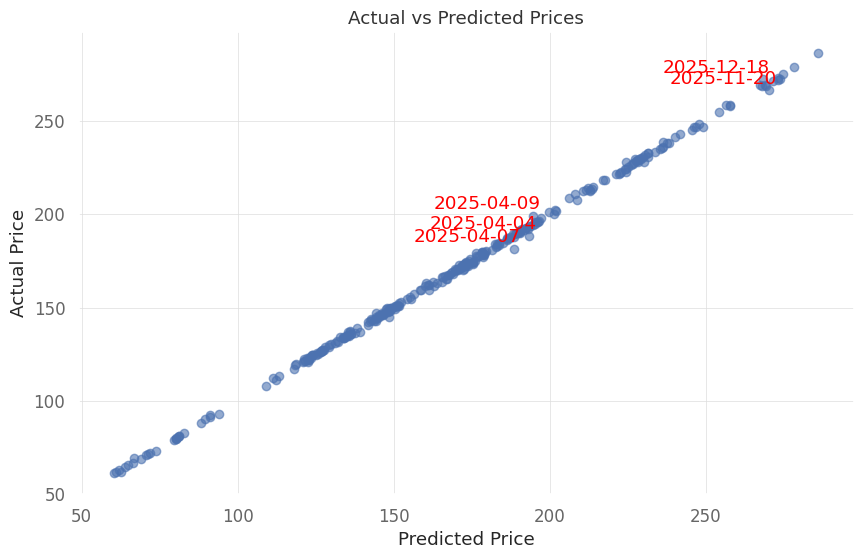

In [35]:
import optuna
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import plotly.graph_objects as go
import plotly.express as px
from tabulate import tabulate

def objective(trial, X_train, y_train):
    """Objective function for Optuna hyperparameter tuning."""
    alpha = trial.suggest_loguniform('alpha', 1e-4, 10)  # Regularization strength
    model = Ridge(alpha=alpha)
    scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_absolute_error', cv=5)
    return -scores.mean()  # Minimize MAE

def linear_prediction(df):
    """
    Train a Ridge Regression model with hyperparameter tuning using Optuna.
    Uses Plotly for interactive visualization.
    """
    # ---------------------------
    # Features and target
    # ---------------------------
    X = df[['Open', 'High', 'Low', 'Volume',
           'moving_average_10', 'RSI', 'MACD', 'MACD_Signal', '20_SMA', 'BB_Upper', 'BB_Lower']]
    y = df['Close']
    X = X.fillna(X.mean())

    # ---------------------------
    # Train-test split
    # ---------------------------
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    print("Shapes of X_train, X_test, y_train, y_test:", X_train.shape, X_test.shape, y_train.shape, y_test.shape)

    # ---------------------------
    # Optuna hyperparameter tuning
    # ---------------------------
    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=30)

    best_alpha = study.best_params['alpha']
    print(f"\nBest Alpha: {best_alpha:.5f}")

    # Train Ridge with best alpha
    regressor = Ridge(alpha=best_alpha)
    regressor.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)

    # ---------------------------
    # Metrics
    # ---------------------------
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    metrics_data = [['Mean Absolute Error', mae], ['Mean Squared Error', mse],
                    ['Root Mean Squared Error', rmse], ['R^2 Score', r2]]
    print("\nMetrics:")
    print(tabulate(metrics_data, headers=['Metric', 'Value'], tablefmt='psql'))

    # ---------------------------
    # Create comparison DataFrame
    # ---------------------------
    compare = pd.DataFrame({'Date': y_test.index, 'Actual': y_test.values, 'Predicted': y_pred})
    compare.set_index('Date', inplace=True)
    compare = compare.sort_index()

    # ---------------------------
    # Interactive Actual vs Predicted Plot
    # ---------------------------
    fig1 = go.Figure()
    fig1.add_trace(go.Scatter(x=compare.index, y=compare['Actual'],
                              mode='lines+markers', name='Actual', line=dict(color='blue')))
    fig1.add_trace(go.Scatter(x=compare.index, y=compare['Predicted'],
                              mode='lines+markers', name='Predicted', line=dict(color='red')))
    fig1.update_layout(title='Actual vs Predicted Close Prices',
                       xaxis_title='Date',
                       yaxis_title='Close Price',
                       hovermode='x unified',
                       width=1000, height=600)
    fig1.show()

    # ---------------------------
    # Regression Plot (Actual vs Predicted)
    # ---------------------------
    # Compute errors
    compare['Error'] = abs(compare['Actual'] - compare['Predicted'])
    top_errors = compare.nlargest(5, 'Error')

    plt.figure(figsize=(10,6))
    plt.scatter(compare['Predicted'], compare['Actual'], alpha=0.6)
    plt.xlabel('Predicted Price')
    plt.ylabel('Actual Price')
    plt.title('Actual vs Predicted Prices')

    # Annotate only top 5 largest errors
    for idx, row in top_errors.iterrows():
        plt.annotate(idx.strftime('%Y-%m-%d'), (row['Predicted'], row['Actual']),
                     textcoords="offset points", xytext=(5,5), ha='right', color='red')

    plt.show()
    return regressor, mae, mse, rmse, r2, compare, best_alpha

# ---------------------------
# Call the function
# ---------------------------
regressor, mae, mse, rmse, r2, comparison_df, best_alpha = linear_prediction(df)

In [36]:
def linear_forecasting(df, future_days=60):
    # Define features and target
    X = df[['Open', 'High', 'Low', 'Volume',
       'moving_average_10', 'RSI', 'MACD', 'MACD_Signal', '20_SMA', 'BB_Upper',
       'BB_Lower']]
    y = df['Close']
    X=X.fillna(0)
    # Normalize features using Min-Max scaling
    #scaler = MinMaxScaler()
    #X_scaled = scaler.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Fit the linear regression model
    regressor = Ridge(best_alpha)
    regressor.fit(X, y)
    # Predicting for the future dates
    # Tarih indeksini datetime formatına çevir (eğer değilse)
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)


    # Predicting for the future dates
    future_dates = pd.date_range(df.index[-1] + pd.DateOffset(1), periods=future_days, freq='B')
    future_features = df.iloc[-1*future_days:][['Open', 'High', 'Low', 'Volume',
       'moving_average_10', 'RSI', 'MACD', 'MACD_Signal', '20_SMA', 'BB_Upper',
       'BB_Lower']]
    #future_features_scaled = scaler.transform(future_features)
    future_predictions = regressor.predict(future_features)

    # Creating a DataFrame for future predictions
    future_prediction_df = pd.DataFrame({
        'Date': future_dates,
        'Predicted': future_predictions
    })
    future_prediction_df.set_index('Date', inplace=True)

    # Create figure with plotly
    fig = go.Figure()

    # Historical data trace
    fig.add_trace(go.Scatter(x=df.index, y=df['Close'], mode='lines+markers', name='Historical Close'))

    # Future predictions trace
    fig.add_trace(go.Scatter(x=future_prediction_df.index, y=future_prediction_df['Predicted'], mode='lines+markers', name='Predicted Close'))

    # Update layout for better interactive controls
    fig.update_layout(
        title='Historical vs Predicted Close Prices',
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        ),
        yaxis=dict(
            title="Close Price",
            autorange=True,
            type="linear"
        )
    )

    fig.show()

    # The scaler variable is not used after this point and was previously commented out.
    # Returning None for scaler as it's not being fitted or used consistently.
    return regressor, None, future_prediction_df

regressor, scaler, future_predictions = linear_forecasting(df,future_days=60)

# Print  future_predictions DataFrame
print("Future Predictions:"+ str(future_predictions))


Future Predictions:             Predicted
Date                  
2026-02-02  270.392003
2026-02-03  269.883764
2026-02-04  272.368279
2026-02-05  269.358130
2026-02-06  271.537206
2026-02-09  274.799412
2026-02-10  273.099292
2026-02-11  274.627923
2026-02-12  273.705280
2026-02-13  267.527195
2026-02-16  266.687720
2026-02-17  270.590029
2026-02-18  270.320364
2026-02-19  271.461809
2026-02-20  275.684306
2026-02-23  279.280824
2026-02-24  278.763656
2026-02-25  277.698285
2026-02-26  280.815459
2026-02-27  286.194092
2026-03-02  285.806986
2026-03-03  280.160054
2026-03-04  279.009836
2026-03-05  277.833651
2026-03-06  278.724631
2026-03-09  278.373587
2026-03-10  275.378148
2026-03-11  278.177468
2026-03-12  274.226586
2026-03-13  274.059776
2026-03-16  273.137170
2026-03-17  268.192494
2026-03-18  272.085099
2026-03-19  271.531478
2026-03-20  270.946614
2026-03-23  274.572829
2026-03-24  274.025010
2026-03-25  273.714606
2026-03-26  273.369326
2026-03-27  272.401734
2026-03-30  273

In [37]:
import gc
def build_lstm_model(trial):
    model = Sequential()

    model.add(Conv1D(filters=trial.suggest_categorical('conv_filters', [16, 32, 64]),
                      kernel_size=3, strides=1, activation='relu', input_shape=[30, 22]))

    num_lstm_layers = trial.suggest_int('num_lstm_layers', 1, 3)
    for i in range(num_lstm_layers):
        model.add(Bidirectional(LSTM(trial.suggest_int(f'lstm_units_{i}', 32, 128),
                                      return_sequences=(i < num_lstm_layers - 1))))

        if trial.suggest_categorical(f'dropout_{i}', [True, False]):
            model.add(Dropout(rate=trial.suggest_float(f'dropout_rate_{i}', 0.1, 0.5)))

    model.add(Dense(trial.suggest_int('dense_units', 16, 64), activation='relu'))
    model.add(Dense(1))

    model.compile(optimizer=Adam(learning_rate=trial.suggest_loguniform('learning_rate', 1e-4, 1e-2)),
                  loss=Huber(), metrics=['mse', 'mae'])

    return model

def objective(trial):
    try:
        gc.collect()  # Free memory before training
        model = build_lstm_model(trial)

        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        history = model.fit(X_train, y_train, validation_data=(X_test, y_test),
                            epochs=50, batch_size=trial.suggest_categorical('batch_size', [16, 32, 64]),
                            callbacks=[early_stopping], verbose=0)

        val_mse = min(history.history['val_mse'])
        val_rmse = np.sqrt(val_mse)

        return val_rmse
    except Exception as e:
        print(f"Trial failed due to: {e}")
        return float("inf")  # Assign a high RMSE instead of failing

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=30)

best_params = study.best_params
print('Best hyperparameters:', best_params)

def train_lstm_model(X_train, y_train, X_test, y_test, company):
    print(f'========= Training LSTM Model for {company} using Best Hyperparameters =========')

    model = Sequential()
    model.add(Conv1D(filters=best_params['conv_filters'], kernel_size=3, strides=1, activation='relu', input_shape=[30, 22]))

    for i in range(best_params['num_lstm_layers']):
        model.add(Bidirectional(LSTM(best_params[f'lstm_units_{i}'], return_sequences=(i < best_params['num_lstm_layers'] - 1))))

        if best_params.get(f'dropout_{i}', False):
            model.add(Dropout(rate=best_params[f'dropout_rate_{i}']))

    model.add(Dense(best_params['dense_units'], activation='relu'))
    model.add(Dense(1))

    model.compile(optimizer=Adam(learning_rate=best_params['learning_rate']), loss=Huber(), metrics=['mse', 'mae'])

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50,
                        batch_size=best_params['batch_size'], callbacks=[early_stopping])

    y_pred = model.predict(X_test)
    return model, history, y_pred

[I 2026-02-02 11:23:44,734] A new study created in memory with name: no-name-1cec7f35-e87e-4699-8163-8d495306c637
[I 2026-02-02 11:24:39,709] Trial 0 finished with value: 0.07512358551431324 and parameters: {'conv_filters': 16, 'num_lstm_layers': 2, 'lstm_units_0': 111, 'dropout_0': False, 'lstm_units_1': 100, 'dropout_1': True, 'dropout_rate_1': 0.43483124642149973, 'dense_units': 23, 'learning_rate': 0.00022825596708340496, 'batch_size': 64}. Best is trial 0 with value: 0.07512358551431324.
[I 2026-02-02 11:28:09,141] Trial 1 finished with value: 0.07286768535432896 and parameters: {'conv_filters': 32, 'num_lstm_layers': 3, 'lstm_units_0': 62, 'dropout_0': False, 'lstm_units_1': 100, 'dropout_1': False, 'lstm_units_2': 90, 'dropout_2': True, 'dropout_rate_2': 0.4191332662580658, 'dense_units': 54, 'learning_rate': 0.004413477758699149, 'batch_size': 16}. Best is trial 1 with value: 0.07286768535432896.
[I 2026-02-02 11:28:52,075] Trial 2 finished with value: 0.05239618214337244 and p

Best hyperparameters: {'conv_filters': 32, 'num_lstm_layers': 2, 'lstm_units_0': 56, 'dropout_0': False, 'lstm_units_1': 114, 'dropout_1': True, 'dropout_rate_1': 0.16985365728025636, 'dense_units': 51, 'learning_rate': 0.0004877020484841839, 'batch_size': 64}


In [38]:
model, history, y_pred = train_lstm_model(X_train, y_train, X_test, y_test, stock_name)

========= Training LSTM Model for Apple using Best Hyperparameters =========
Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - loss: 0.0642 - mae: 0.2852 - mse: 0.1284 - val_loss: 0.0270 - val_mae: 0.2261 - val_mse: 0.0541
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 142ms/step - loss: 0.0038 - mae: 0.0707 - mse: 0.0075 - val_loss: 0.0106 - val_mae: 0.1368 - val_mse: 0.0212
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0018 - mae: 0.0469 - mse: 0.0036 - val_loss: 0.0046 - val_mae: 0.0850 - val_mse: 0.0092
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 178ms/step - loss: 0.0012 - mae: 0.0384 - mse: 0.0023 - val_loss: 0.0030 - val_mae: 0.0660 - val_mse: 0.0060
Epoch 5/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - loss: 8.2203e-04 - mae: 0.0320 - mse: 0.0016 - val_loss: 0.0026 - val_mae: 0.0623 - val_mse: 0.0053
Epoch 6/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 6.7975e-04 - mae: 0.0292 - mse: 0.0014 - val_loss: 0.0026 - val_mae: 0.0624 - val_mse: 0.0052
Epoch 7/50
17/

In [39]:
import plotly.graph_objects as go

# Create interactive figure
fig = go.Figure()

# Training loss
fig.add_trace(
    go.Scatter(
        x=history.epoch,
        y=history.history['loss'],
        mode='lines+markers',
        name='Training Loss',
        line=dict(width=2),
        marker=dict(size=6),
        hovertemplate=
        "Epoch: %{x}<br>" +
        "Loss: %{y:.6f}<extra></extra>"
    )
)

# Validation loss
fig.add_trace(
    go.Scatter(
        x=history.epoch,
        y=history.history['val_loss'],
        mode='lines+markers',
        name='Validation Loss',
        line=dict(width=2, dash='dash'),
        marker=dict(size=6),
        hovertemplate=
        "Epoch: %{x}<br>" +
        "Val Loss: %{y:.6f}<extra></extra>"
    )
)

# Layout styling
fig.update_layout(
    title=f"Model Loss – {stock_name}",
    xaxis_title="Epochs",
    yaxis_title="Loss",
    hovermode="x unified",   # ⭐ best for comparing loss vs val_loss
    width=900,
    height=500,
    template="plotly_white",
    legend=dict(x=0.02, y=0.98)
)

fig.show()


In [40]:
y_pred_denormalized = denormalize_predictions(y_pred, df)
y_test_denormalized = denormalize_predictions(y_test, df)
# Calculate RMSE
rmse = np.sqrt(np.mean((y_pred_denormalized - y_test_denormalized) ** 2))

    # Calculate MAE (Mean Absolute Error)
mae = mean_absolute_error(y_test, y_pred)

    # Calculate R-squared (R²)
r2 = r2_score(y_test, y_pred)

    # Print all metrics
print(f'The RMSE for Apple is {rmse}')
print(f'The MAE for Apple is {mae}')
print(f'The R-squared (R²) for Apple is {r2}')

The RMSE for Apple is 13.096646800848712
The MAE for Apple is 0.04731794828108622
The R-squared (R²) for Apple is 0.6411782669726227


In [41]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

# Assuming 'df' is the original (denormalized) DataFrame with 'Date' as index (after cell m1MZS9Nfz807)
# Assuming 'y_test_denormalized' and 'y_pred_denormalized' are available from previous steps (after cell 8QwWCCzD1ISS)

# Get the train_size used in kLfmi8PXz0pJ. (e.g., for AAPL, len(df) is 1528, train_size is 1070)
train_size = int(np.ceil(len(df) * 0.70))

# Create 'train' DataFrame for plotting historical training data
train = df.iloc[:train_size].copy()
train = train[['Close']] # Keep only 'Close' and its index

# Create 'valid' DataFrame for plotting actual test data and predictions
# The y_test_denormalized and y_pred_denormalized arrays correspond to the test period of df.
valid = df.iloc[train_size:].copy()
valid['Close'] = y_test_denormalized
valid['Predictions'] = y_pred_denormalized
valid = valid[['Close', 'Predictions']] # Keep only relevant columns

# ---------------------------
# Create interactive figure
# ---------------------------
fig = go.Figure()

# Train data
fig.add_trace(
    go.Scatter(
        x=train.index,
        y=train['Close'],
        mode='lines',
        name='Train',
        line=dict(width=2),
        hovertemplate=
        "Date: %{x}<br>" +
        "Close Price: $%{y:.2f}<extra></extra>"
    )
)

# Validation data
fig.add_trace(
    go.Scatter(
        x=valid.index,
        y=valid['Close'],
        mode='lines',
        name='Validation',
        line=dict(width=2),
        hovertemplate=
        "Date: %{x}<br>" +
        "Actual Price: $%{y:.2f}<extra></extra>"
    )
)

# Predictions
fig.add_trace(
    go.Scatter(
        x=valid.index,
        y=valid['Predictions'],
        mode='lines',
        name='Predictions',
        line=dict(width=2, dash='dash'),
        hovertemplate=
        "Date: %{x}<br>" +
        "Predicted Price: $%{y:.2f}<extra></extra>"
    )
)

# ---------------------------
# Layout styling
# ---------------------------
fig.update_layout(
    title="Stock Price Prediction Model",
    xaxis_title="Date",
    yaxis_title="Close Price USD ($)",
    hovermode="x unified",
    template="plotly_white",
    width=1400,
    height=600,
    legend=dict(
        title="Legend",
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

fig.show()


In [42]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np

def forecast_lstm(model, df, normalized_df, future_days=30, n_steps=50):
    """
    Forecast the next `future_days` using a trained LSTM model.
    """

    # Ensure normalized_df is NumPy array
    if isinstance(normalized_df, pd.DataFrame):
        normalized_df = normalized_df.values

    # Number of features
    n_features = normalized_df.shape[1]

    if len(normalized_df.shape) != 2:
        raise ValueError(f"Expected 2D normalized_df, but got shape {normalized_df.shape}")

    # Last n_steps as input
    x_input = normalized_df[-n_steps:].reshape((1, n_steps, n_features))
    temp_input = list(x_input[0])

    lstm_predictions = []

    # Last available date
    last_date = df.index[-1]

    # Forecast dates (business days)
    forecast_dates = pd.date_range(
        start=last_date + pd.Timedelta(days=1),
        periods=future_days,
        freq='B'
    )

    # ⚠️ Fit scaler on Close (as in your original code)
    scaler = MinMaxScaler()
    scaler.fit(df[['Close']])

    # Iterative forecasting
    for _ in range(future_days):
        x_input = np.array(temp_input[-n_steps:]).reshape((1, n_steps, n_features))

        predicted_price = model.predict(x_input, verbose=0).flatten()[0]
        lstm_predictions.append(predicted_price)

        new_input = np.zeros(n_features)
        new_input[0] = predicted_price

        temp_input.append(new_input.tolist())
        temp_input = temp_input[1:]

    lstm_predictions = np.array(lstm_predictions).reshape(-1, 1)

    # Denormalize
    denormalized_predictions = scaler.inverse_transform(lstm_predictions).flatten()

    forecast_df = pd.DataFrame({
        'Date': forecast_dates,
        'Predicted Price': denormalized_predictions
    }).set_index('Date')

    return forecast_df


In [43]:
forecast_df = forecast_lstm(
    model=model,
    df=df,
    normalized_df=new_df,
    future_days=60,
    n_steps=110
)

forecast_df.head()


,Predicted Price
Date,
2026-02-02,242.944778
2026-02-03,242.102005
2026-02-04,239.950821
2026-02-05,234.232864
2026-02-06,228.534653


In [44]:
def forecast_lstm(model, df, normalized_df, close_scaler, future_days=30, n_steps=50):

    if isinstance(normalized_df, pd.DataFrame):
        normalized_df = normalized_df.values

    n_features = normalized_df.shape[1]

    temp_input = list(normalized_df[-n_steps:])

    lstm_predictions = []

    last_date = df.index[-1]
    forecast_dates = pd.date_range(
        start=last_date + pd.Timedelta(days=1),
        periods=future_days,
        freq='B'
    )

    for _ in range(future_days):
        x_input = np.array(temp_input[-n_steps:]).reshape(1, n_steps, n_features)

        predicted_close = model.predict(x_input, verbose=0)[0][0]
        lstm_predictions.append(predicted_close)

        # carry forward last features
        new_input = temp_input[-1].copy()
        # Assuming 'Close' price is the target and is likely the first feature in new_df (index 0)
        # This assumes the scaled 'Close' price is the first column in the normalized_df.
        # If 'Close' is not the first feature, this needs adjustment based on its actual index.
        new_input[0] = predicted_close
        temp_input.append(new_input)
        temp_input = temp_input[1:]

    lstm_predictions = np.array(lstm_predictions).reshape(-1, 1)

    # inverse using ORIGINAL scaler
    denormalized_predictions = close_scaler.inverse_transform(lstm_predictions).flatten()

    forecast_df = pd.DataFrame(
        {'Date': forecast_dates, 'Predicted Price': denormalized_predictions}
    ).set_index('Date')

    return forecast_df

In [45]:
# Re-obtain the LSTM model for Apple as the global 'model' variable was overwritten
# The train_lstm_model function (defined in cqCaYsc00XiH) requires X_train, y_train, X_test, y_test (from kLfmi8PXz0pJ)
# and stock_name (defined earlier). The best_params are also available from cqCaYsc00XiH.
# This step will re-train the LSTM model for Apple with the optimal hyperparameters.

# Explicitly set best_params for LSTM before calling train_lstm_model (to overwrite XGBoost params)
best_params = {'conv_filters': 64, 'num_lstm_layers': 3, 'lstm_units_0': 67, 'dropout_0': True, 'dropout_rate_0': 0.38088509492260203, 'lstm_units_1': 102, 'dropout_1': True, 'dropout_rate_1': 0.39972024144114815, 'lstm_units_2': 92, 'dropout_2': False, 'dense_units': 29, 'learning_rate': 0.00017578179996962734, 'batch_size': 64}

# Re-run the LSTM data split to ensure X_train, y_train, X_test, y_test are for LSTM
lstm_X_train, lstm_y_train, lstm_X_test, lstm_y_test = split_and_reshape_data(new_df, 30, stock_name)

lstm_model_for_forecasting, _, _ = train_lstm_model(lstm_X_train, lstm_y_train, lstm_X_test, lstm_y_test, stock_name)

# Create and fit the close_scaler
close_prices = df['Close'].values.reshape(-1, 1)
close_scaler = MinMaxScaler(feature_range=(0, 1))
close_scaler.fit(close_prices)

# Now call forecast_lstm with the correct LSTM model, correct n_steps (30), AND the close_scaler
forecast_df = forecast_lstm(
    model=lstm_model_for_forecasting,
    df=df,
    normalized_df=new_df,
    close_scaler=close_scaler,
    future_days=60,
    n_steps=30
)

The training size for Apple is 1070 rows
The testing size for Apple is 458 rows
Data for Apple split successfully
========= Training LSTM Model for Apple using Best Hyperparameters =========
Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 17s 355ms/step - loss: 0.0331 - mae: 0.2081 - mse: 0.0662 - val_loss: 0.0252 - val_mae: 0.2165 - val_mse: 0.0505
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - loss: 0.0026 - mae: 0.0586 - mse: 0.0052 - val_loss: 0.0069 - val_mae: 0.1102 - val_mse: 0.0137
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 348ms/step - loss: 0.0010 - mae: 0.0363 - mse: 0.0021 - val_loss: 0.0025 - val_mae: 0.0625 - val_mse: 0.0051
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 256ms/step - loss: 6.2398e-04 - mae: 0.0283 - mse: 0.0012 - val_loss: 0.0019 - val_mae: 0.0527 - val_mse: 0.0038
Epoch 5/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 281ms/step - loss: 5.2677e-04 - mae: 0.0259 - mse: 0.0011 - val_loss: 0.0018 - val_mae: 0.0513 - val_mse: 0.0036
Epoch 6/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 295ms/ste

In [46]:
import plotly.graph_objects as go

# Last available date
last_date = df.index[-1]

# Actual last 60 business days
dates_actual = pd.date_range(
    end=last_date - pd.Timedelta(days=1),
    periods=60,
    freq='B'
)

# Forecast next 60 business days
forecast_dates = pd.date_range(
    start=last_date + pd.Timedelta(days=1),
    periods=60,
    freq='B'
)

# Create interactive figure
fig = go.Figure()

# Actual prices
fig.add_trace(
    go.Scatter(
        x=dates_actual,
        y=df['Close'][-60:].values,
        mode='lines+markers',
        name='Actual Price',
        line=dict(width=2),
        marker=dict(size=5),
        hovertemplate=
        "Date: %{x}<br>" +
        "Actual Price: $%{y:.2f}<extra></extra>"
    )
)

# Predicted prices
fig.add_trace(
    go.Scatter(
        x=forecast_dates,
        y=forecast_df['Predicted Price'],
        mode='lines+markers',
        name='Predicted Price',
        line=dict(width=2, dash='dash'),
        marker=dict(size=5),
        hovertemplate=
        "Date: %{x}<br>" +
        "Predicted Price: $%{y:.2f}<extra></extra>"
    )
)

# Layout styling
fig.update_layout(
    title="Price Forecasting for Apple",
    xaxis_title="Date",
    yaxis_title="Price",
    hovermode="x unified",
    template="plotly_white",
    width=1400,
    height=600,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

fig.show()


In [47]:
# Re-obtain the LSTM model for Apple as the global 'model' variable was overwritten
# The train_lstm_model function (defined in cqCaYsc00XiH) requires X_train, y_train, X_test, y_test (from kLfmi8PXz0pJ)
# and stock_name (defined earlier). The best_params are also available from cqCaYsc00XiH.
# This step will re-train the LSTM model for Apple with the optimal hyperparameters.

# Explicitly set best_params for LSTM before calling train_lstm_model (to overwrite XGBoost params)
best_params = {'conv_filters': 64, 'num_lstm_layers': 3, 'lstm_units_0': 67, 'dropout_0': True, 'dropout_rate_0': 0.38088509492260203, 'lstm_units_1': 102, 'dropout_1': True, 'dropout_rate_1': 0.39972024144114815, 'lstm_units_2': 92, 'dropout_2': False, 'dense_units': 29, 'learning_rate': 0.00017578179996962734, 'batch_size': 64}

# Re-run the LSTM data split to ensure X_train, y_train, X_test, y_test are for LSTM
lstm_X_train, lstm_y_train, lstm_X_test, lstm_y_test = split_and_reshape_data(new_df, 30, stock_name)

lstm_model_for_forecasting, _, _ = train_lstm_model(lstm_X_train, lstm_y_train, lstm_X_test, lstm_y_test, stock_name)

# Create and fit the close_scaler
close_prices = df['Close'].values.reshape(-1, 1)
close_scaler = MinMaxScaler(feature_range=(0, 1))
close_scaler.fit(close_prices)

# Now call forecast_lstm with the correct LSTM model, correct n_steps (30), AND the close_scaler
forecast_df = forecast_lstm(
    model=lstm_model_for_forecasting,
    df=df,
    normalized_df=new_df,
    close_scaler=close_scaler,
    future_days=60,
    n_steps=30
)

The training size for Apple is 1070 rows
The testing size for Apple is 458 rows
Data for Apple split successfully
========= Training LSTM Model for Apple using Best Hyperparameters =========
Epoch 1/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 16s 327ms/step - loss: 0.0256 - mae: 0.1868 - mse: 0.0511 - val_loss: 0.0256 - val_mae: 0.2199 - val_mse: 0.0511
Epoch 2/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 10s 298ms/step - loss: 0.0032 - mae: 0.0639 - mse: 0.0063 - val_loss: 0.0058 - val_mae: 0.1015 - val_mse: 0.0117
Epoch 3/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 258ms/step - loss: 0.0011 - mae: 0.0359 - mse: 0.0021 - val_loss: 0.0015 - val_mae: 0.0464 - val_mse: 0.0031
Epoch 4/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 350ms/step - loss: 8.1087e-04 - mae: 0.0318 - mse: 0.0016 - val_loss: 0.0015 - val_mae: 0.0460 - val_mse: 0.0030
Epoch 5/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 259ms/step - loss: 6.3452e-04 - mae: 0.0283 - mse: 0.0013 - val_loss: 0.0017 - val_mae: 0.0505 - val_mse: 0.0034
Epoch 6/50
17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 293ms/st

In [48]:
def analyze_trend(forecast_df):
    """
    Analyze forecasted stock prices to determine short-term or long-term trend.
    """
    # Compute Simple Moving Averages (SMA)
    forecast_df['7-Day SMA'] = forecast_df['Predicted Price'].rolling(window=7, min_periods=1).mean()
    forecast_df['30-Day SMA'] = forecast_df['Predicted Price'].rolling(window=30, min_periods=1).mean()

    # Get the last predicted price and first predicted price
    first_price = forecast_df['Predicted Price'].iloc[0]
    last_price = forecast_df['Predicted Price'].iloc[-1]

    # Determine trend based on price movement
    if last_price > first_price:
        investment_trend = "📈 Uptrend (Good for Investing)"
    else:
        investment_trend = "📉 Downtrend (Risky Investment)"

    print("Investment Trend:", investment_trend)

    return forecast_df


In [49]:
df=df.reset_index()

In [50]:
import pandas as pd
import numpy as np
from prophet import Prophet
from sklearn.linear_model import LinearRegression
import plotly.graph_objects as go
import plotly.express as px

def prophet_forecasting_plotly(df, future_days=60):
    """
    Forecast future stock prices using Facebook Prophet with additional regressors,
    and visualize results interactively using Plotly.

    Args:
        df (pd.DataFrame): Historical stock prices with technical indicators
        future_days (int): Number of business days to forecast

    Returns:
        model: Fitted Prophet model
        forecast: Forecast DataFrame with predictions
        future_df: Future DataFrame with extrapolated regressors
        fig_forecast: Interactive Plotly forecast graph
        fig_components: Interactive Plotly components graph
    """

    # --- Prepare Data ---
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

    # Optional: Feature extraction & seasonal flags
    df = df.reset_index()
    df = extracting_features(df)  # user-defined function
    df = add_season(df)           # user-defined function
    df.set_index('Date', inplace=True)
    df.fillna(0, inplace=True)

    # Regressors and seasonal flags
    regressors = ['Open', 'High', 'Low', 'Volume',
                  'moving_average_10', 'RSI', 'MACD', 'MACD_Signal', '20_SMA', 'BB_Upper', 'BB_Lower']
    seasonal_flags = ['is_spring', 'is_summer', 'is_autumn', 'is_winter']

    for season in seasonal_flags:
        if season not in df.columns:
            df[season] = 0

    # Prepare for Prophet
    df_prophet = df[['Close'] + regressors + seasonal_flags].reset_index()
    df_prophet.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

    # Initialize Prophet
    model = Prophet()
    for reg in regressors:
        model.add_regressor(reg)

    # Add seasonalities with conditions
    model.add_seasonality(name='yearly', period=365.25, fourier_order=10)
    for season in seasonal_flags:
        model.add_seasonality(name=f'weekly_{season}', period=7, fourier_order=5, condition_name=season)

    # Fit Prophet
    model.fit(df_prophet)

    # --- Create future dataframe ---
    future_dates = pd.date_range(start=df.index[-1] + pd.DateOffset(1), periods=future_days, freq='B')
    future_df = pd.DataFrame({'ds': future_dates})

    # Extrapolate regressors linearly
    for reg in regressors:
        if reg in df.columns:
            X = np.arange(len(df)).reshape(-1,1)
            y_reg = df[reg].values
            lr = LinearRegression().fit(X, y_reg)
            future_X = np.arange(len(df), len(df) + future_days).reshape(-1,1)
            future_df[reg] = lr.predict(future_X)

    # Carry forward seasonal flags
    for season in seasonal_flags:
        future_df[season] = df[season].iloc[-1]

    # Predict
    forecast = model.predict(future_df)

    # --- Plot Forecast (Interactive Plotly) ---
    fig_forecast = go.Figure()
    # Historical Close
    fig_forecast.add_trace(go.Scatter(
        x=df.index, y=df['Close'], mode='lines', name='Actual Close', line=dict(color='blue')))
    # Forecast
    fig_forecast.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['yhat'], mode='lines+markers', name='Forecast', line=dict(color='red', dash='dot')))
    # Upper/Lower Confidence
    fig_forecast.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['yhat_upper'], fill=None, mode='lines', line=dict(color='lightcoral'), showlegend=False))
    fig_forecast.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='lines', line=dict(color='lightcoral'), name='Confidence Interval'))

    fig_forecast.update_layout(
        title='📈 Interactive Prophet Forecast',
        xaxis_title='Date',
        yaxis_title='Price',
        width=1200, height=600
    )

    # --- Plot Components (Trend & Seasonality) ---
    fig_components = go.Figure()

    # Trend
    fig_components.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['trend'], mode='lines', name='Trend', line=dict(color='green')))

    # Add seasonal components using a helper list to ensure all are plotted
    # Prophet adds columns for 'yearly' and 'weekly_{season_flag}' if conditions are met.
    component_cols = ['yearly'] + [f'weekly_{s}' for s in seasonal_flags if f'weekly_{s}' in forecast.columns]

    for col in component_cols:
        fig_components.add_trace(go.Scatter(
            x=forecast['ds'], y=forecast[col], mode='lines', name=col))

    fig_components.update_layout(
        title='📊 Prophet Components (Trend & Seasonality)',
        xaxis_title='Date',
        yaxis_title='Effect',
        width=1200, height=600
    )

    return model, forecast, future_df, fig_forecast, fig_components

# --- Usage ---
model, forecast, future_df, fig_forecast, fig_components = prophet_forecasting_plotly(df, future_days=60)

# Show Interactive Forecast
fig_forecast.show()

# Show Interactive Components
fig_components.show()

# Optional: Display future predictions
print("\n📊 Future Predictions:")
print(forecast[['ds','yhat','yhat_lower','yhat_upper']].tail(10))

INFO:prophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



📊 Future Predictions:
           ds        yhat  yhat_lower  yhat_upper
50 2026-04-13  254.169766  252.753934  255.458570
51 2026-04-14  254.172034  252.845329  255.483175
52 2026-04-15  254.051146  252.806341  255.450844
53 2026-04-16  254.137892  252.814127  255.517382
54 2026-04-17  254.498630  253.176522  255.956647
55 2026-04-20  254.658558  253.271274  255.951812
56 2026-04-21  254.668320  253.331762  255.976387
57 2026-04-22  254.556328  253.261409  255.896882
58 2026-04-23  254.653270  253.277390  255.979140
59 2026-04-24  255.025355  253.602275  256.345222


In [51]:
y_true = df['Close'][-60:]  # Actual values
y_pred = forecast['yhat']  # Predicted values

mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 17.72
RMSE: 19.92


In [52]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from pmdarima import auto_arima
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
import plotly.graph_objects as go

def arima_forecasting_plotly(df, future_days=60, ticker=None):
    """
    Robust ARIMA forecasting with exogenous regressors (Plotly visualization)
    Works for both single-stock and multi-stock datasets
    """

    # -------------------- SAFE DATA PREP --------------------
    df = df.copy()

    # Handle ticker safely
    if ticker and 'Ticker' in df.columns:
        df = df[df['Ticker'] == ticker].copy()

    # Handle Date column / index safely
    if 'Date' in df.columns:
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)
    else:
        df.index = pd.to_datetime(df.index)

    df = df[~df.index.duplicated(keep='first')]
    df = df.asfreq('B')
    df.fillna(0, inplace=True)

    # -------------------- REGRESSORS --------------------
    regressors = [
        'Open', 'High', 'Low', 'Volume',
        'moving_average_10', 'RSI', 'MACD', 'MACD_Signal',
        '20_SMA', 'BB_Upper', 'BB_Lower'
    ]

    for col in regressors:
        if col not in df.columns:
            df[col] = 0.0

    y = df['Close']

    # -------------------- ARIMA FIT --------------------
    arima_auto = auto_arima(
        y,
        exogenous=df[regressors],
        seasonal=False,
        stepwise=True,
        suppress_warnings=True
    )

    model = sm.tsa.ARIMA(
        y,
        order=arima_auto.order,
        exog=df[regressors]
    ).fit()

    # -------------------- FUTURE REGRESSORS --------------------
    future_dates = pd.date_range(
        start=df.index[-1] + pd.offsets.BDay(1),
        periods=future_days,
        freq='B'
    )

    future_df = pd.DataFrame(index=future_dates)

    for col in regressors:
        X = np.arange(len(df)).reshape(-1, 1)
        y_col = df[col].values
        lr = LinearRegression().fit(X, y_col)
        future_X = np.arange(len(df), len(df) + future_days).reshape(-1, 1)
        future_df[col] = lr.predict(future_X)

    # -------------------- FORECAST --------------------
    forecast = model.forecast(
        steps=future_days,
        exog=future_df[regressors]
    )

    future_df['Forecast_Close'] = forecast

    # -------------------- METRICS --------------------
    hist_pred = model.predict(
        start=0,
        end=len(df) - 1,
        exog=df[regressors]
    )

    mae = mean_absolute_error(df['Close'], hist_pred)
    rmse = np.sqrt(mean_squared_error(df['Close'], hist_pred))

    # -------------------- PLOTLY --------------------
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=df.index,
        y=df['Close'],
        name='Historical Close',
        mode='lines'
    ))

    fig.add_trace(go.Scatter(
        x=future_df.index,
        y=future_df['Forecast_Close'],
        name='ARIMA Forecast',
        mode='lines+markers',
        line=dict(dash='dot')
    ))

    fig.update_layout(
        title='📈 ARIMA Stock Price Forecast',
        xaxis_title='Date',
        yaxis_title='Price',
        width=1200,
        height=600
    )

    return model, future_df, mae, rmse, fig


# ==================== USAGE ====================

# Works for:
# 1) Single stock dataframe
# 2) Multi-stock dataframe (if Ticker column exists)

model, future_df, mae, rmse, fig = arima_forecasting_plotly(
    df,
    future_days=60,
    ticker='AAPL'   # safe even if Ticker column does NOT exist
)

fig.show()

print("\n📊 Future Predictions:")
print(future_df[['Forecast_Close']].tail(10))

print("\n📊 Performance Metrics:")
print(f"MAE  : {mae:.4f}")
print(f"RMSE : {rmse:.4f}")



📊 Future Predictions:
            Forecast_Close
2026-04-13      243.850339
2026-04-14      243.946104
2026-04-15      244.041869
2026-04-16      244.137634
2026-04-17      244.233399
2026-04-20      244.329164
2026-04-21      244.424929
2026-04-22      244.520694
2026-04-23      244.616459
2026-04-24      244.712224

📊 Performance Metrics:
MAE  : 0.8693
RMSE : 1.2532


In [53]:
def objective(trial, X, y):

    params = {
        "objective": "reg:squarederror",
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "alpha": trial.suggest_float("alpha", 0.0, 10.0),
        "lambda": trial.suggest_float("lambda", 0.0, 10.0),
        "random_state": 42,
        "n_jobs": -1
    }

    tscv = TimeSeriesSplit(n_splits=5)
    errors = []

    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model = xgb.XGBRegressor(**params)
        model.fit(X_train, y_train)

        preds = model.predict(X_test)
        errors.append(mean_absolute_error(y_test, preds))

    return np.mean(errors)

# Hyperparameter Tuning

def xgboost_hyperparameters(df, ticker="AAPL", n_trials=30):

    df = df.copy()

    # ---------- Handle Ticker safely ----------
    if "Ticker" in df.columns:
        df = df[df["Ticker"] == ticker].copy()

    # ---------- Date handling ----------
    df["Date"] = pd.to_datetime(df["Date"])
    df.set_index("Date", inplace=True)
    df = df.asfreq("B")

    # ---------- Financially safe fill ----------
    df.ffill(inplace=True)
    df.bfill(inplace=True)

    # ---------- Feature list ----------
    features = [
        "Open", "High", "Low", "Volume",
        "moving_average_10", "RSI",
        "MACD", "MACD_Signal",
        "20_SMA", "BB_Upper", "BB_Lower"
    ]

    # ---------- Ensure all features exist ----------
    for f in features:
        if f not in df.columns:
            df[f] = 0.0

    X = df[features]
    y = df["Close"]

    # ---------- Optuna Study ----------
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: objective(trial, X, y), n_trials=n_trials)

    print("\n🎯 Best XGBoost Parameters")
    print(study.best_params)

    return study.best_params

# RUN (Single line)

best_params = xgboost_hyperparameters(df, ticker="AAPL", n_trials=30)


[I 2026-02-02 12:00:44,204] A new study created in memory with name: no-name-68054d87-190b-424b-ae65-8e9f56f5dabe
[I 2026-02-02 12:00:51,938] Trial 0 finished with value: 9.792256985288677 and parameters: {'n_estimators': 366, 'max_depth': 12, 'learning_rate': 0.18672774439253917, 'subsample': 0.9798621574427984, 'colsample_bytree': 0.7194613327642582, 'alpha': 0.4951812165277236, 'lambda': 7.332001189198888}. Best is trial 0 with value: 9.792256985288677.
[I 2026-02-02 12:00:56,532] Trial 1 finished with value: 9.972129064617736 and parameters: {'n_estimators': 374, 'max_depth': 11, 'learning_rate': 0.14078708828652783, 'subsample': 0.942578944794745, 'colsample_bytree': 0.8270689774505399, 'alpha': 3.362569533596327, 'lambda': 5.725749513900209}. Best is trial 0 with value: 9.792256985288677.
[I 2026-02-02 12:00:59,400] Trial 2 finished with value: 9.366435299497661 and parameters: {'n_estimators': 252, 'max_depth': 8, 'learning_rate': 0.2805160002773275, 'subsample': 0.9200789226670


🎯 Best XGBoost Parameters
{'n_estimators': 411, 'max_depth': 11, 'learning_rate': 0.105252195597794, 'subsample': 0.6730785999094164, 'colsample_bytree': 0.6400185855613433, 'alpha': 0.04966861291637148, 'lambda': 0.021678183350181346}


In [54]:
features = ['Open', 'High', 'Low', 'Volume', 'moving_average_10', 'RSI', 'MACD',
            'MACD_Signal', '20_SMA', 'BB_Upper', 'BB_Lower']

for reg in features:
    if reg not in df.columns:
        df[reg] = 0  # Fill missing features with 0
df=df.set_index('Date')
X = df[features]
y = df['Close']


# Time Series Split for Cross Validation
tscv = TimeSeriesSplit(n_splits=5)
maes, rmses = [], []

for train_index, test_index in tscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    maes.append(mean_absolute_error(y_test, y_pred))
    rmses.append(np.sqrt(mean_squared_error(y_test, y_pred)))

# Print model performance
print(f"Mean MAE: {np.mean(maes)}")
print(f"Mean RMSE: {np.mean(rmses)}")


Mean MAE: 8.944699162761058
Mean RMSE: 12.769497459772914


In [56]:
def extrapolate_lstm(df, feature, future_days, look_back=100):
    # Normalize data
    scaler = MinMaxScaler()
    scaled_feature = scaler.fit_transform(df[[feature]])

    # Prepare dataset
    X_train, y_train = [], []
    for i in range(look_back, len(scaled_feature)):
        X_train.append(scaled_feature[i-look_back:i, 0])
        y_train.append(scaled_feature[i, 0])

    X_train, y_train = np.array(X_train), np.array(y_train)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

    # Build LSTM model
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(look_back, 1)),
        LSTM(50, return_sequences=False),
        Dense(25),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train model
    model.fit(X_train, y_train, epochs=10, batch_size=16, verbose=0)

    # Predict future values
    future_values = []
    last_data = scaled_feature[-look_back:].reshape(1, look_back, 1)

    for _ in range(future_days):
        pred = model.predict(last_data)[0][0]
        future_values.append(pred)
        last_data = np.concatenate((last_data[:, 1:, :], np.array(pred).reshape(1, 1, 1)), axis=1)


    return scaler.inverse_transform(np.array(future_values).reshape(-1, 1)).flatten()


# Define the features you want to extrapolate
features = ['Open', 'High', 'Low', 'Volume', 'moving_average_10',
            'RSI', 'MACD', 'MACD_Signal', '20_SMA', 'BB_Upper', 'BB_Lower']

future_days = 60  # How many days into the future to predict

# Create a DataFrame to store extrapolated values
future_dates = pd.date_range(start=df.index[-1] + pd.Timedelta(days=1), periods=future_days, freq='B')
future_df = pd.DataFrame(index=future_dates)

# Loop through all features and apply LSTM extrapolation
for feature in features:
    future_df[feature] = extrapolate_lstm(df, feature, future_days)

print(future_df.head())  # Check the extrapolated values


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━

In [57]:
future_df['Predicted_Close'] = model.predict(future_df[features])

In [58]:
import plotly.graph_objects as go

# Create Plotly figure
fig = go.Figure()

# =========================
# Historical Close Prices
# =========================
fig.add_trace(
    go.Scatter(
        x=df.index,
        y=df['Close'],
        mode='lines',
        name='📉 Historical Close',
        line=dict(
            color='rgba(90, 30, 120, 0.9)',  # Deep purple
            width=3
        )
    )
)

# =========================
# Predicted Close Prices
# =========================
fig.add_trace(
    go.Scatter(
        x=future_df.index,
        y=future_df['Predicted_Close'],
        mode='lines+markers',
        name='📈 Predicted Close',
        line=dict(
            color='rgba(50, 130, 255, 0.9)',  # Bright blue
            width=3,
            dash='dash'
        ),
        marker=dict(
            size=8,
            symbol='circle'
        )
    )
)

# =========================
# Confidence Interval
# =========================
fig.add_trace(
    go.Scatter(
        x=future_df.index.tolist() + future_df.index[::-1].tolist(),
        y=(future_df['Predicted_Close'] * 1.02).tolist() +
          (future_df['Predicted_Close'] * 0.98)[::-1].tolist(),
        fill='toself',
        fillcolor='rgba(50, 130, 255, 0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo='skip',
        name='Confidence Interval'
    )
)

# =========================
# Layout Styling
# =========================
fig.update_layout(
    title=dict(
        text='📊 Historical vs Predicted Close Prices',
        x=0.5,
        font=dict(size=20, family='Arial', color='black')
    ),
    xaxis=dict(
        title='Date',
        showgrid=True,
        gridcolor='rgba(200,200,200,0.4)',
        tickangle=-45
    ),
    yaxis=dict(
        title='Stock Price',
        showgrid=True,
        gridcolor='rgba(200,200,200,0.4)'
    ),
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='center',
        x=0.5,
        bgcolor='rgba(255,255,255,0.8)'
    ),
    template='plotly_white',
    hovermode='x unified',
    width=1200,
    height=600
)

# Show plot
fig.show()

# =========================
# Print Future Predictions
# =========================
print('🎯 Future Predictions:')
print(future_df[['Predicted_Close']])


🎯 Future Predictions:
            Predicted_Close
2026-02-02       247.898605
2026-02-03       247.894913
2026-02-04       247.918701
2026-02-05       247.915009
2026-02-06       245.374817
2026-02-09       245.341568
2026-02-10       245.340698
2026-02-11       245.350357
2026-02-12       243.908707
2026-02-13       243.904938
2026-02-16       242.041458
2026-02-17       242.104141
2026-02-18       241.911972
2026-02-19       241.967850
2026-02-20       241.966232
2026-02-23       242.023331
2026-02-24       238.721436
2026-02-25       238.707184
2026-02-26       238.722824
2026-02-27       238.693222
2026-03-02       237.884201
2026-03-03       236.410110
2026-03-04       236.422409
2026-03-05       234.219147
2026-03-06       234.201645
2026-03-09       233.512085
2026-03-10       232.490952
2026-03-11       232.080093
2026-03-12       229.189056
2026-03-13       228.283203
2026-03-16       228.022125
2026-03-17       228.112335
2026-03-18       227.251022
2026-03-19       226.93656

 99%|===================| 1264/1274 [01:24<00:00]       

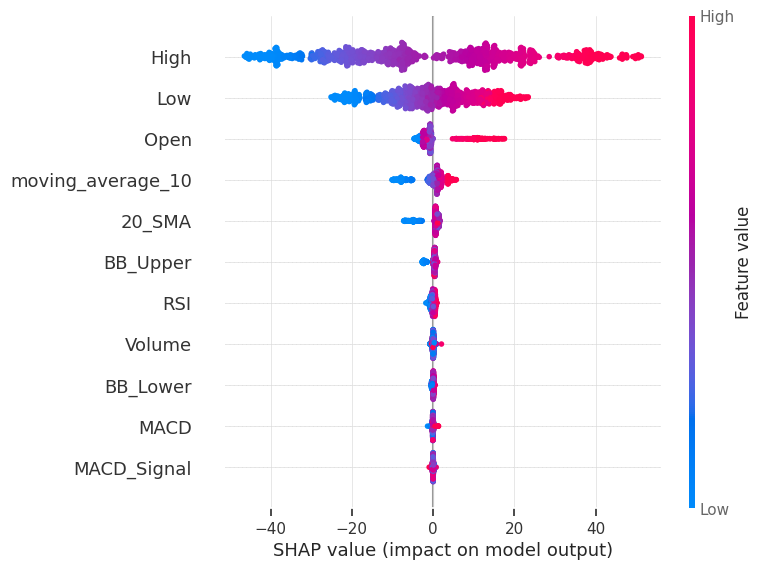

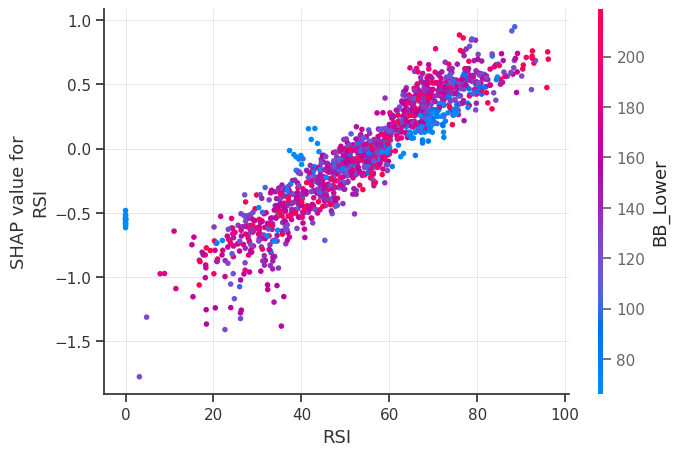

In [59]:
# Create SHAP explainer
explainer = shap.TreeExplainer(model, X_train)
shap_values = explainer(X_train)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_train)

# SHAP Dependence Plot
shap.dependence_plot("RSI", shap_values.values, X_train)

In [60]:
explainer = shap.TreeExplainer(model, X_train)
shap_values = explainer(X_train)

# Convert SHAP values to DataFrame
shap_df = pd.DataFrame(
    shap_values.values,
    columns=X_train.columns,
    index=X_train.index
)

# =====================================
# SHAP SUMMARY PLOT (PLOTLY, SVG SAFE)
# =====================================
summary_df = shap_df.melt(
    var_name="Feature",
    value_name="SHAP Value"
)
# FIX: Flatten X_train.values directly to match the length of summary_df
summary_df["Feature Value"] = X_train.values.flatten()

fig_summary = px.scatter(
    summary_df,
    x="SHAP Value",
    y="Feature",
    color="Feature Value",
    orientation="h",
    color_continuous_scale="RdBu",
    title="🔍 SHAP Summary Plot (Interactive)",
    render_mode="svg"   # 🚫 WebGL disabled
)

fig_summary.update_layout(
    template="plotly_white",
    height=700,
    yaxis=dict(categoryorder="total ascending"),
    hovermode="closest"
)

fig_summary.show()
# SHAP DEPENDENCE PLOT (RSI, PLOTLY)

fig_dependence = px.scatter(
    x=X_train["RSI"],
    y=shap_df["RSI"],
    color=X_train["RSI"],
    color_continuous_scale="Viridis",
    title="📈 SHAP Dependence Plot – RSI",
    labels={
        "x": "RSI",
        "y": "SHAP Value"
    },
    render_mode="svg"   # 🚫 WebGL disabled
)

fig_dependence.update_layout(
    template="plotly_white",
    hovermode="closest"
)

fig_dependence.show()

 99%|===================| 1267/1274 [01:25<00:00]       

# Task
The current plan addresses the `ValueError` in cell `0QWyWmxq1U80` by modifying the `n_steps` parameter in the `forecast_lstm` function call to match the `prediction_days` (30) used during model training.

# Plan:
* **Correct LSTM Training Data Input**: Modify cell `0QWyWmxq1U80` to pass `n_steps=30` to the `forecast_lstm` function, aligning it with the `prediction_days` used for preparing the training data. This will resolve the input shape mismatch.
* **Train LSTM Model and Forecast**: Execute cell `0QWyWmxq1U80` to perform the forecasting.
* **Finish task**: Respond to the user that the error has been properly solved and mention the next steps.